In [25]:
!export CUDA_VISIBLE_DEVICES=0

import torch, os
import numpy as np 

import matplotlib.pyplot as plt

from copy import deepcopy
from plotly.offline import init_notebook_mode

from vae_dist.dataset.dataset import FieldDataset
from vae_dist.data.visualize import get_latent_space
from vae_dist.core.training_utils import construct_model 
from vae_dist.dataset.fields import split_and_filter
import json 

init_notebook_mode(connected=True)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [26]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

def plot_vfield(mat, cutoff_low = 95, cutoff_high = 99.999, min_max = True, scale = 10):
        x = mat #dataset_test.data[0] 
        x = x.reshape(21, 21, 21, 3)
        u_1, v_1, w_1 = split_and_filter(x, min_max = min_max, cutoff_low = cutoff_low, cutoff_high = cutoff_high)  
        a, b, c = np.meshgrid(
                np.arange(-3, 3.3, 0.3),
                np.arange(-3, 3.3, 0.3),
                np.arange(-3, 3.3, 0.3)
                )

        #max value of each dimension
        max_u = np.max(u_1)
        max_v = np.max(v_1)
        max_w = np.max(w_1)
        print(max_u, max_v, max_w)
        
        cones = go.Cone(
                x=a.flatten(), 
                y=b.flatten(), 
                z=c.flatten(), 
                u=u_1 ,
                v=v_1 , 
                w=w_1 ,
                sizeref=scale,)
                #opacity=0.0) 
                

        return cones

In [27]:
model_list = []
model_names = "model_single_datapoint.ckpt"

for model_type in ['auto']:
    options = json.load(open('./options/options_{}_default.json'.format(model_type)))
    model_temp = construct_model(model_type, options)
    model_temp.load_model("./log_version_{}_1/{}".format(model_type, model_names))
    model_temp.to(device)
    model_list.append(deepcopy(model_temp))

inner_dim:  11
channel_in:  3
channel_out:  32
kernel:  4
stride:  1
channel_in:  32
channel_out:  64
kernel:  5
stride:  1
channel_in:  64
channel_out:  128
kernel:  4
stride:  1
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv3d-1       [-1, 32, 18, 18, 18]           6,176
              ReLU-2       [-1, 32, 18, 18, 18]               0
         ConvBatch-3       [-1, 32, 18, 18, 18]               0
            Conv3d-4       [-1, 64, 14, 14, 14]         256,064
              ReLU-5       [-1, 64, 14, 14, 14]               0
         ConvBatch-6       [-1, 64, 14, 14, 14]               0
            Conv3d-7      [-1, 128, 11, 11, 11]         524,416
              ReLU-8      [-1, 128, 11, 11, 11]               0
         ConvBatch-9      [-1, 128, 11, 11, 11]               0
Total params: 786,656
Trainable params: 786,656
Non-trainable params: 0
-------------------------------------------

In [28]:
root = '../../data/single_field/'

dataset_single = FieldDataset(
    root, 
    transform=False, 
    augmentation=False,
    standardize=True,
    lower_filter=True,
    log_scale=True, 
    device=device
    )

dataset_loader_full = torch.utils.data.DataLoader(
                dataset_single, 
                batch_size=1,
                shuffle=True,
                num_workers=0
            )

Largest value in dataset:  3.15
Smallest value in dataset:  -4.11
Nan values in dataset:  False
Inf values in dataset:  False



Aug
Total number of fields:  5

Aug


IndexError: list index out of range

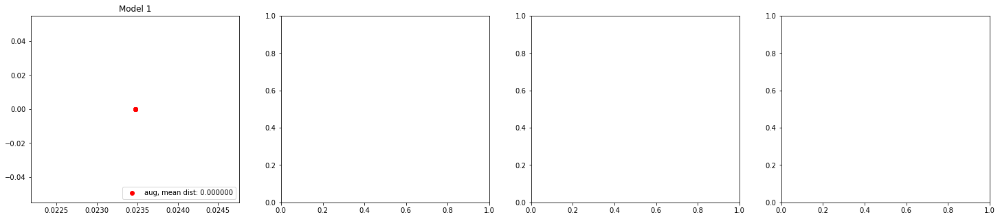

In [30]:
def mean_distance(latent_space):
    mean_dist = 0
    for i in range(latent_space.shape[0]):
        for j in range(latent_space.shape[0]):
            mean_dist += np.linalg.norm(latent_space[i] - latent_space[j])
    mean_dist /= latent_space.shape[0]**2
    return mean_dist


fig, axs = plt.subplots(1, 4, figsize=(25, 5))
# iterate over the sub plots
for i, ax in enumerate(axs.flatten()):
    # plot the data
    print()
    print("Aug")
    latent_space_aug = get_latent_space(model_list[i], dataset_single, comp=[0, 1], latent_dim=100)
    mean_aug = mean_distance(latent_space_aug)

    ax.scatter(
        latent_space_aug[:, 0], 
        latent_space_aug[:, 1], c="red", 
        label="aug, mean dist: {:.6f}".format(mean_aug))

    # legend bottom right
    ax.legend(loc="lower right")
    ax.set_title(f"Model {i+1}")

In [33]:
def show_in_out_plots(in_field, model):
    fig = make_subplots(
        rows=1, cols=2,
        specs=[[{'type': 'cone'}, {'type': 'cone'}]])

    model = model_list[0]
    x = in_field.reshape(1, 3, 21, 21, 21).to(device)
    x_out = model.forward(x)
    x_out = x_out.to('cpu').detach().numpy().reshape(3, 21, 21, 21)

    field_in = plot_vfield(
            x.cpu().numpy(), 
            cutoff_low = 80, 
            cutoff_high=100, 
            min_max = False,
            scale = 2)
    
    field_out = plot_vfield(
            x_out, 
            cutoff_low = 80, 
            cutoff_high=100, 
            min_max = False,
            scale = 2)

    # add field_in to the first subplot
    fig.add_trace(field_in , row=1, col=1)
    # add field_out to the second subplot
    fig.add_trace(field_out, row=1, col=2)
    fig.show()
    
show_in_out_plots(dataset_single[0], model_list[0])


3.15 3.13 1.73
0.08 0.08 0.08


: 

In [31]:
show_in_out_plots(dataset_single[0], model_list[1])


3.15 3.13 1.73
0.09 0.09 0.09


In [33]:
show_in_out_plots(dataset_single[0], model_list[2])


3.15 3.13 1.73
0.1 0.1 0.1


In [34]:
show_in_out_plots(dataset_single[0], model_list[3])


3.15 3.13 1.73
0.09 0.09 0.09
